### Submitted by: Naailah Mahamoodally (40269839)
Explainable Occupancy Detection Using PCA

In [104]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/My Drive/INSE 6220 Project'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/INSE 6220 Project


## Install Libraries

In [105]:
!pip install pycaret

In [106]:
!pip install PCA

In [107]:
!pip install shap

## Import Libraries

In [108]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.decomposition import PCA
np.random.seed(8)
from sklearn import feature_selection

In [109]:
print("Pandas version: ", pd.__version__)
print("Numpy version: ", np.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  2.0.3
Numpy version:  1.25.2
Seaborn version:  0.13.1


## Import Dataset

In [110]:
df= pd.read_csv("Occupancy_Estimation.csv")

In [112]:
y = df['Presence']
X = df.drop(['Time', 'Presence'], axis= 1)

## Data Exploration

In [113]:
df.shape

(1068, 13)

In [114]:
len(df.index)

1068

In [115]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1068 entries, 0 to 1067
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Time           1068 non-null   int64  
 1   co2            1068 non-null   int64  
 2   Temperature_1  1068 non-null   float64
 3   Temperature_2  1068 non-null   float64
 4   Temperature_3  1068 non-null   float64
 5   Door_Contact   1068 non-null   int64  
 6   Motion         1068 non-null   int64  
 7   Humidity_1     1068 non-null   int64  
 8   Humidity_2     1068 non-null   float64
 9   Humidity_3     1068 non-null   float64
 10  COV            1068 non-null   int64  
 11  Mean_Power     1068 non-null   float64
 12  Presence       1068 non-null   int64  
dtypes: float64(6), int64(7)
memory usage: 108.6 KB


In [116]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [117]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


Class 0: 772 instances
Class 1: 192 instances
Class 2: 104 instances


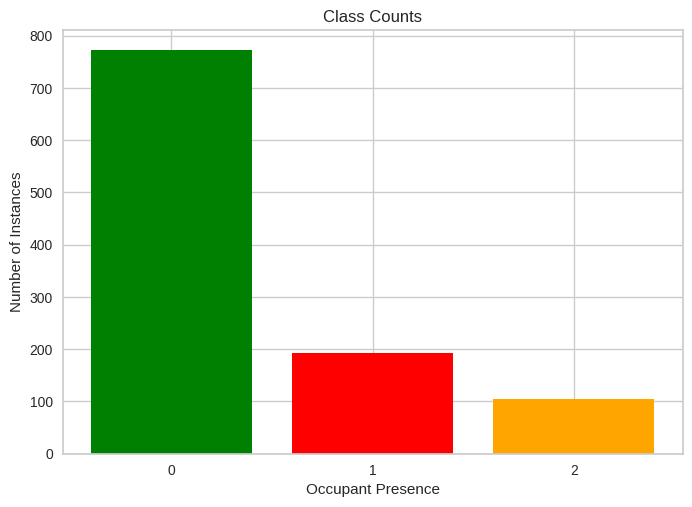

In [118]:
unique_classes, class_counts = np.unique(y, return_counts=True)
colors = ['green', 'red', 'orange']
# Print the results
for class_label, count in zip(unique_classes, class_counts):
    print(f"Class {class_label}: {count} instances")
plt.bar(unique_classes, class_counts, color=colors)
plt.xlabel('Occupant Presence')
plt.ylabel('Number of Instances')
plt.title('Class Counts')
plt.xticks(unique_classes.astype(int))
plt.show()

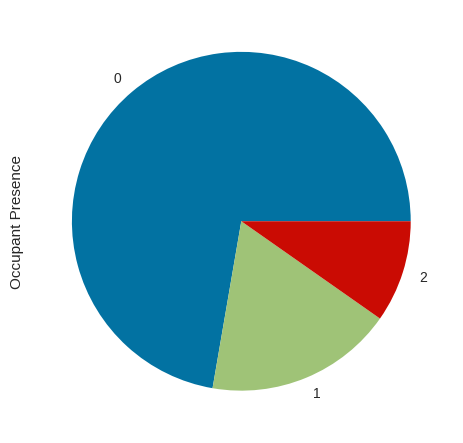

In [119]:
y.value_counts().plot(kind='pie')
plt.ylabel('Occupant Presence')
plt.show()

In [120]:
#Create new dataframe without the Time Feature
df1= pd.concat([X, y], axis=1)

In [121]:
df1.head(2)

,co2,Temperature_1,Temperature_2,Temperature_3,Door_Contact,Motion,Humidity_1,Humidity_2,Humidity_3,COV,Mean_Power,Presence
0,390,17.2,18.08,17.28,0,1,30,34.4,38.0,24,8.25,0
1,390,17.2,18.08,17.28,0,0,30,34.4,38.0,25,8.25,0


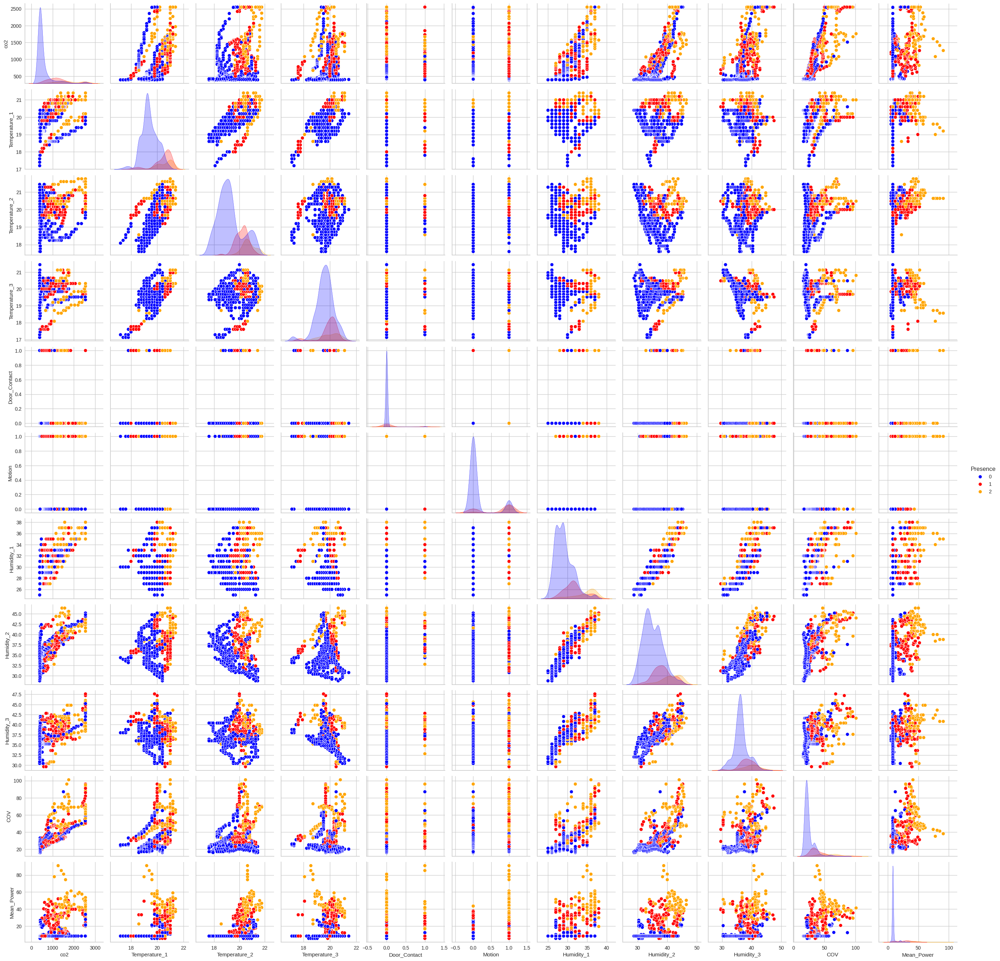

In [122]:
#Pairplot Diagram
custom_palette = {0: 'blue', 1: 'red', 2:'orange'}
sns.pairplot(df1, hue='Presence', palette=custom_palette)
plt.show()

In [123]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
co2,1068.0,815.065543,608.208683,390.00,390.00,470.00,1100.00,2550.00
Temperature_1,1068.0,19.710300,0.798925,17.20,19.20,19.60,20.40,21.40
Temperature_2,1068.0,19.550861,1.011054,17.60,18.72,19.36,20.48,21.76
Temperature_3,1068.0,19.711910,0.704365,17.12,19.36,19.84,20.16,21.44
Door_Contact,1068.0,0.050562,0.219204,0.00,0.00,0.00,0.00,1.00
Motion,1068.0,0.308052,0.461905,0.00,0.00,0.00,1.00,1.00
Humidity_1,1068.0,30.056180,2.984281,25.00,28.00,29.00,32.00,38.00
Humidity_2,1068.0,36.283146,3.841369,28.80,33.20,36.00,38.80,46.40
Humidity_3,1068.0,37.092135,2.834897,29.60,35.20,36.40,38.80,47.60
COV,1068.0,30.357678,14.895744,16.00,21.00,24.00,35.00,101.00


In [124]:
#observations and variables
observations = list(df.index)
variables = list(df1.columns)

### Standardization

In [125]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(X)

In [126]:
Xcols = X.columns
data_scaled = pd.DataFrame(data_scaled)
data_scaled.columns = Xcols
data_scaled.head(10)

,co2,Temperature_1,Temperature_2,Temperature_3,Door_Contact,Motion,Humidity_1,Humidity_2,Humidity_3,COV,Mean_Power
0,-0.699209,-3.143567,-1.455461,-3.454247,-0.230769,1.498733,-0.018834,-0.490458,0.320396,-0.427012,-0.544184
1,-0.699209,-3.143567,-1.455461,-3.454247,-0.230769,-0.667230,-0.018834,-0.490458,0.320396,-0.359847,-0.544184
2,-0.699209,-2.893114,-1.297137,-3.681509,-0.230769,-0.667230,-0.018834,-0.594636,0.320396,-0.359847,-0.544184
3,-0.699209,-2.893114,-1.297137,-3.681509,-0.230769,-0.667230,-0.018834,-0.594636,0.320396,-0.359847,-0.544184
4,-0.699209,-2.642660,-1.138812,-3.681509,-0.230769,-0.667230,-0.018834,-0.594636,0.320396,-0.359847,-0.544184
5,-0.699209,-2.642660,-1.138812,-3.681509,-0.230769,1.498733,-0.018834,-0.594636,0.320396,-0.359847,-0.544184
6,-0.699209,-2.642660,-1.138812,-3.454247,-0.230769,1.498733,-0.018834,-0.594636,0.461561,-0.359847,-0.544184
7,-0.699209,-2.642660,-0.980487,-3.681509,-0.230769,1.498733,-0.018834,-0.698814,0.602726,-0.359847,-0.544184
8,-0.699209,-2.642660,-0.980487,-3.681509,-0.230769,1.498733,-0.018834,-0.698814,0.602726,-0.359847,-0.544184
9,-0.699209,-2.392207,-0.822162,-3.681509,-0.230769,1.498733,-0.018834,-0.698814,0.602726,-0.359847,-0.544184


In [127]:
data_scaled.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
co2,1068.0,-5.322417e-17,1.000468,-0.699209,-0.699209,-0.567613,0.468701,2.853868
Temperature_1,1068.0,1.596725e-15,1.000468,-3.143567,-0.639032,-0.138125,0.863690,2.115957
Temperature_2,1068.0,1.244115e-15,1.000468,-1.930436,-0.822162,-0.188863,0.919410,2.186009
Temperature_3,1068.0,-2.661209e-16,1.000468,-3.681509,-0.499848,0.181937,0.636460,2.454552
Door_Contact,1068.0,-1.995907e-17,1.000468,-0.230769,-0.230769,-0.230769,-0.230769,4.333333
Motion,1068.0,-7.983626e-17,1.000468,-0.667230,-0.667230,-0.667230,1.498733,1.498733
Humidity_1,1068.0,-1.862846e-16,1.000468,-1.695065,-0.689326,-0.354080,0.651658,2.663135
Humidity_2,1068.0,3.991813e-16,1.000468,-1.948954,-0.802992,-0.073744,0.655504,2.634892
Humidity_3,1068.0,1.836234e-15,1.000468,-2.644063,-0.667757,-0.244263,0.602726,3.708350
COV,1068.0,-1.330604e-16,1.000468,-0.964329,-0.628506,-0.427012,0.311800,4.744672


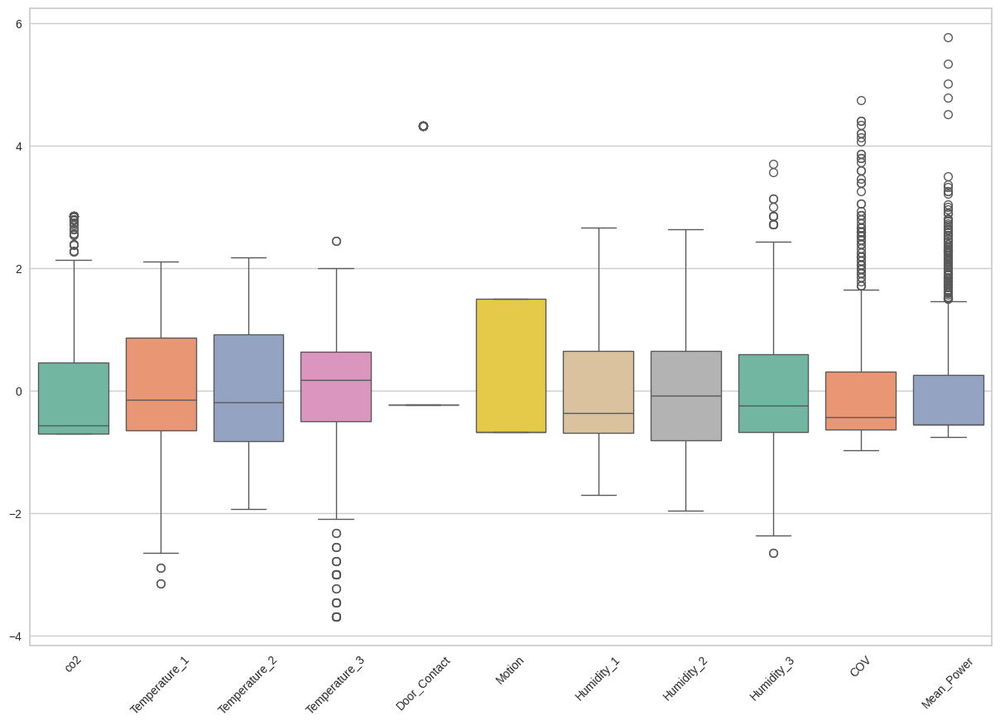

In [128]:
#visualisation of the data using a box plot
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=data_scaled, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

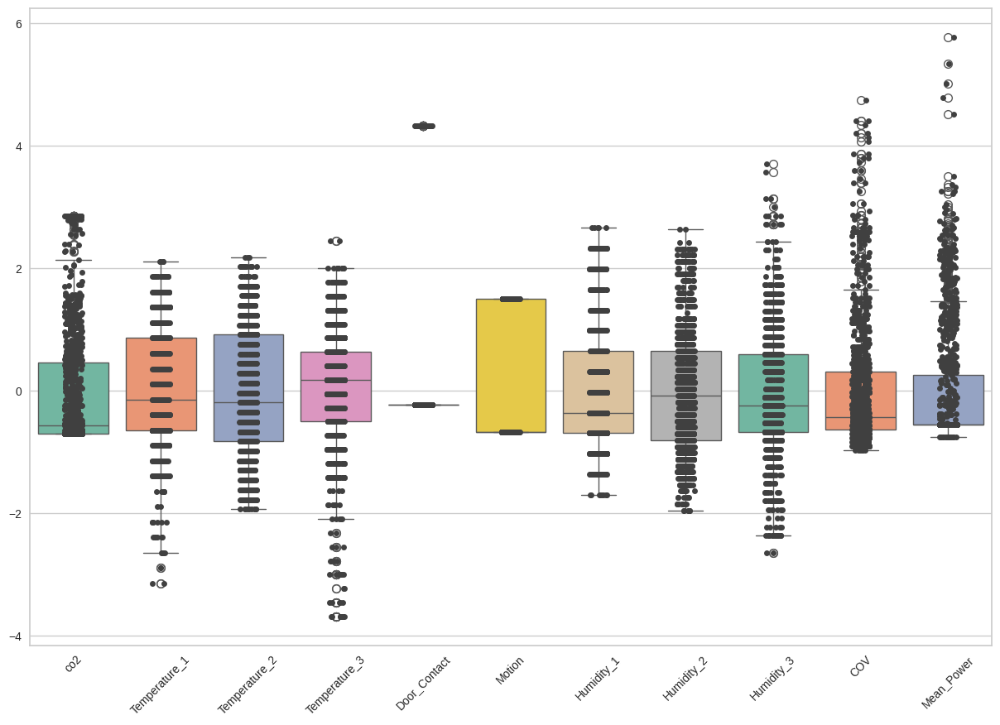

In [129]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=data_scaled, orient="v", palette="Set2")
ax = sns.stripplot(data=data_scaled, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

Text(0.5, 1.0, 'Pairplot')

<Figure size 800x550 with 0 Axes>

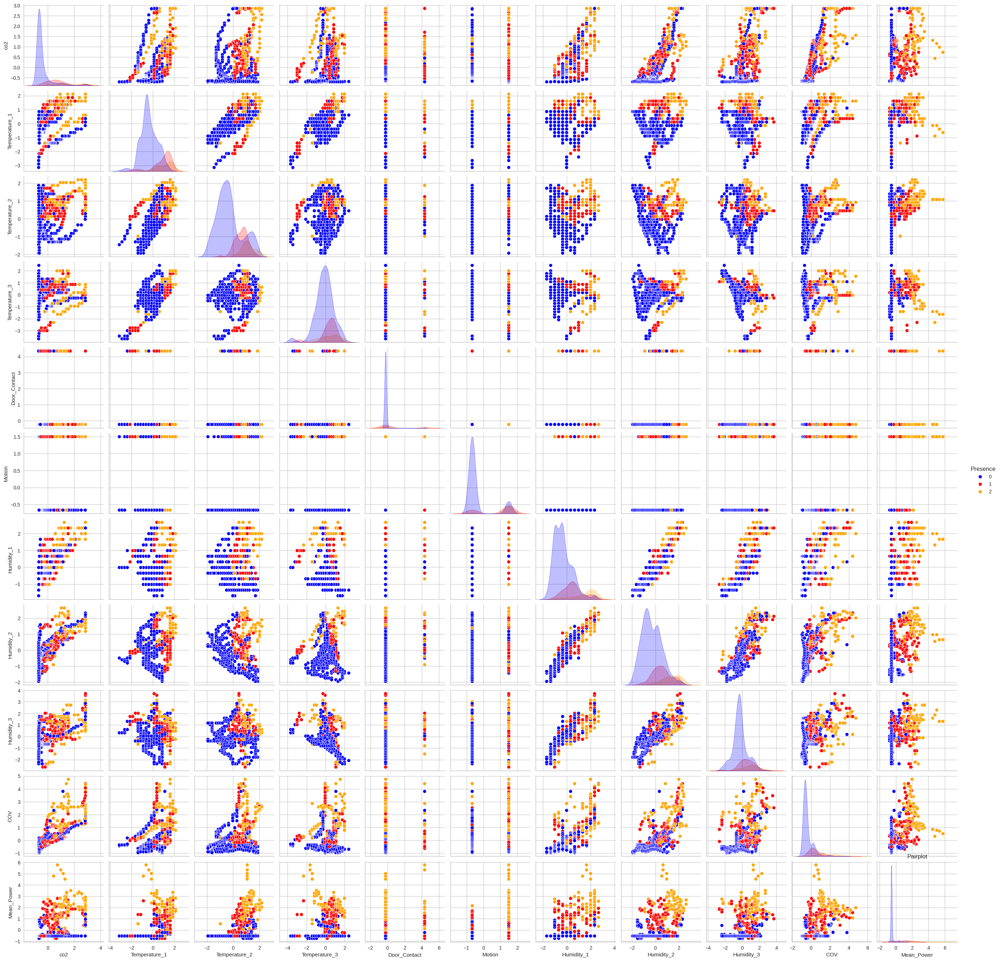

In [130]:
#pairplot
data_scaled =pd.DataFrame(data_scaled)
data_scaled2 = pd.concat([data_scaled, y], axis=1)
plt.figure()
sns.pairplot(data_scaled2, hue='Presence', palette=custom_palette)
plt.title('Pairplot')

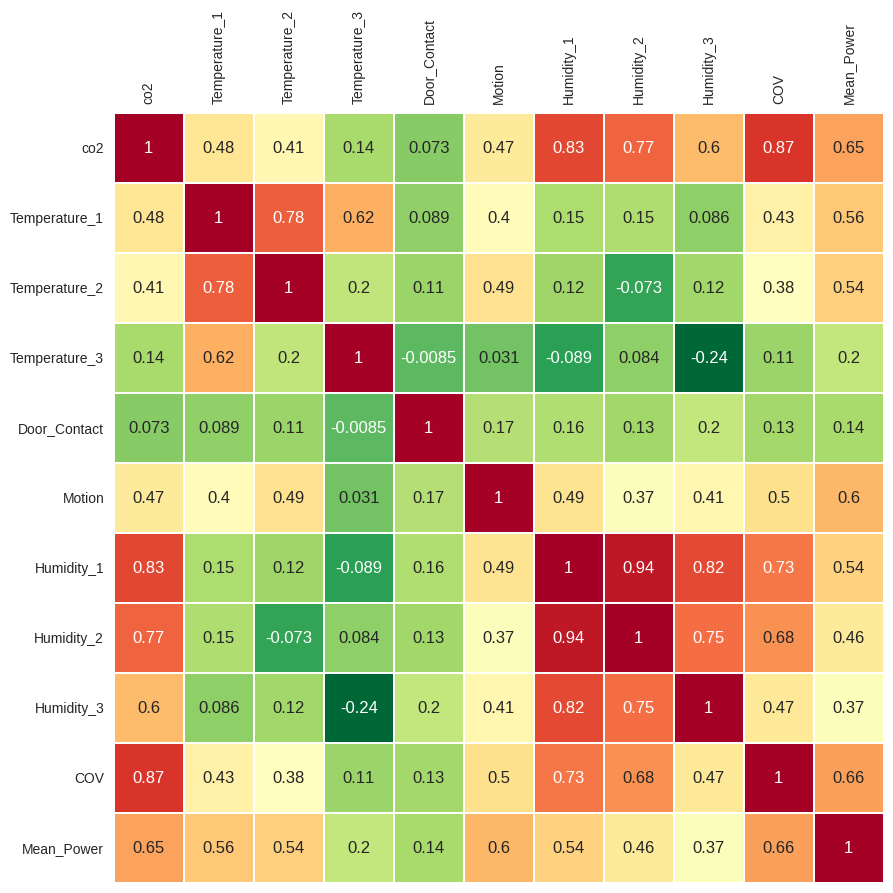

In [131]:
#Correlation Matrix
fig1,ax1 = plt.subplots(figsize=(10,10))
ax = sns.heatmap(data_scaled.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

Text(0.5, 1.0, 'Covariance matrix')

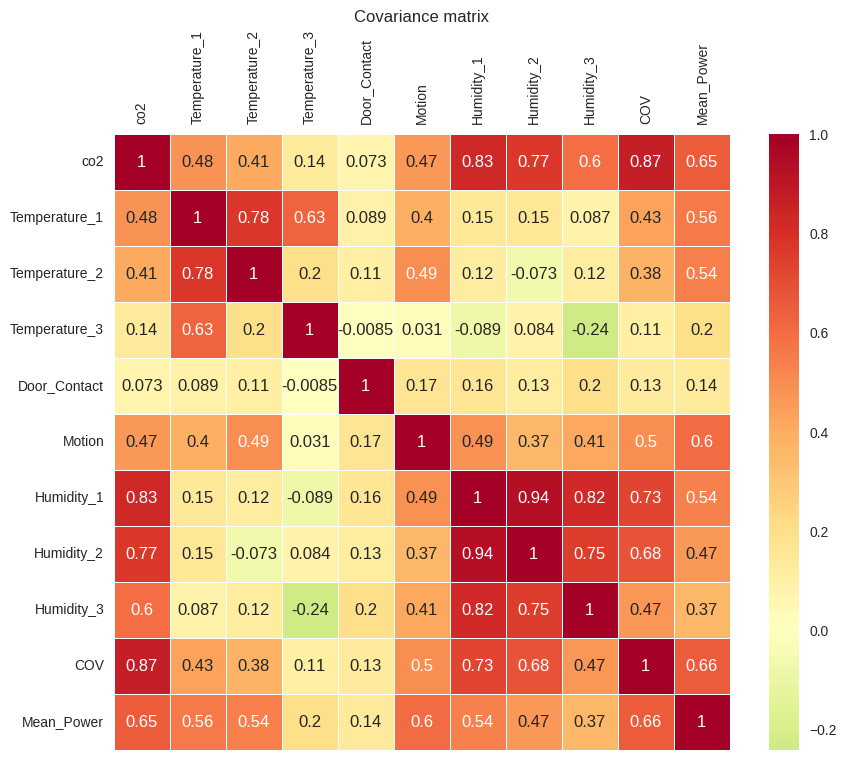

In [132]:
#Covariance Matrix
plt. figure(figsize=(10, 8))
ax = sns.heatmap(data_scaled.cov(), center=0,cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=True, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('Covariance matrix')

### Feature importance

In [133]:
#ANOVA using f_classif
chi2, pval = feature_selection.f_classif(X,y)
np.round(chi2)

array([ 476.,  300.,  200.,   24.,   55.,  299.,  299.,  230.,  124.,
        578., 1215.])

In [134]:
#Mutual Information for classification using mutual_info_classification
from sklearn.preprocessing import LabelEncoder
for col in X:
    le = LabelEncoder()
    X[col]  = le.fit_transform(X[col])
feature_selection.mutual_info_classif(X, y)

array([0.33703827, 0.30339416, 0.2743444 , 0.11431132, 0.03986358,
       0.17699896, 0.19939218, 0.17658039, 0.17190265, 0.34082838,
       0.45219629])

In [135]:
#SelectKBest
selector = feature_selection.SelectKBest(k=7, score_func=feature_selection.mutual_info_classif)
data = selector.fit_transform(X,y)
selector.scores_

array([0.34373035, 0.30169033, 0.26647497, 0.11438554, 0.0393371 ,
       0.1802765 , 0.21051933, 0.18389279, 0.13965257, 0.34625924,
       0.4581424 ])

### PCA

In [136]:
pca = PCA()
Z = pca.fit_transform(data_scaled)
#pcs = pd.DataFrame(pcs)
#pcs.columns = ['pc_' + str(i) for i in range(1, 1)]

Text(0, 0.5, '$Z_2$')

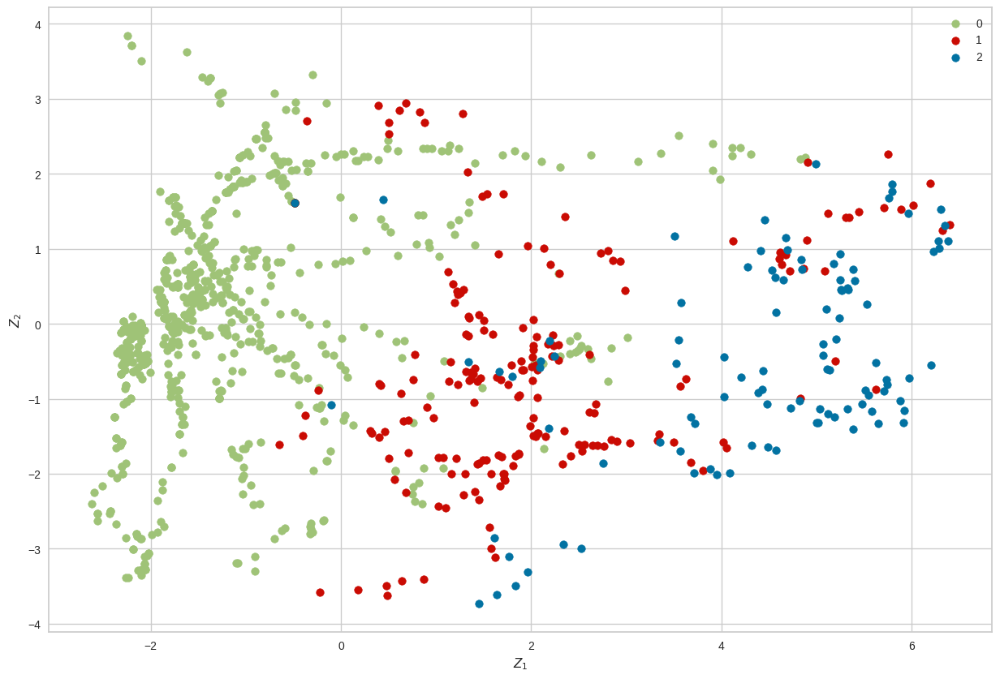

In [137]:
idx_zero= np.where(y == 0)
idx_one = np.where(y == 1)
idx_two = np.where(y == 2)

plt. figure(figsize=(15,10))
plt.scatter(Z[idx_zero,0], Z[idx_zero,1], c='g', label='0')
plt.scatter(Z[idx_one,0], Z[idx_one,1], c='r', label='1')
plt.scatter(Z[idx_two,0], Z[idx_two,1], c='b', label='2')

plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

In [138]:
eigenvectors = pca.components_
eigenvectors

array([[ 0.40199884,  0.24599605,  0.21907548,  0.07025762,  0.09290087,
         0.29841995,  0.38027143,  0.34979822,  0.30873113,  0.38062449,
         0.34657261],
       [ 0.03719998, -0.51028012, -0.45552633, -0.43222953,  0.02103459,
        -0.10176583,  0.30330296,  0.30844932,  0.33691651,  0.01109076,
        -0.17982109],
       [-0.1811961 , -0.07947061,  0.32583071, -0.51476411,  0.58279276,
         0.35606951, -0.07827305, -0.28588395,  0.1299638 , -0.10940608,
         0.08096406],
       [-0.05431225,  0.07712125, -0.26118786,  0.4593584 ,  0.7836976 ,
        -0.21870291,  0.02324398,  0.19003044, -0.00647202, -0.04221082,
        -0.10669989],
       [ 0.31744685,  0.11772032,  0.32422576, -0.31108744,  0.12148693,
        -0.73603235, -0.01439317, -0.1298014 , -0.00928983,  0.29154613,
        -0.15756895],
       [ 0.08571971, -0.30462854, -0.26040214, -0.11434346,  0.12572417,
         0.06009464, -0.07249004, -0.06065394, -0.63448854,  0.46798061,
         0.411

In [139]:
eigenvalues = pca.explained_variance_
eigenvalues

array([5.19790075, 2.21585836, 1.09465804, 0.92382545, 0.51516955,
       0.47113631, 0.30869933, 0.11549017, 0.0898426 , 0.06612914,
       0.01159958])

<Figure size 800x550 with 0 Axes>

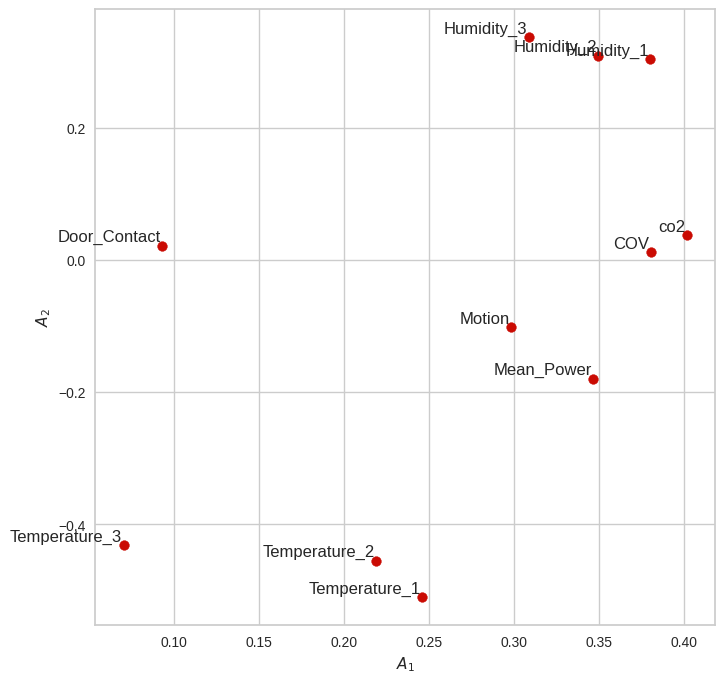

In [140]:
#Eigenvectors
A = pca.components_.T
plt. figure()
plt.figure(figsize=(8,8))
plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$');
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
    plt.annotate(label, xy=(x, y), xytext=(-1, 1),
        textcoords='offset points', ha='right', va='bottom')



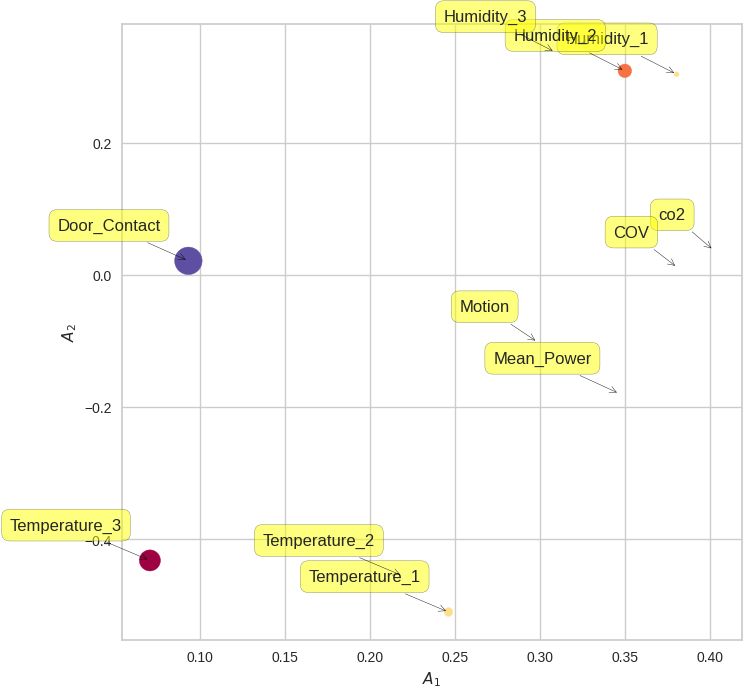

In [141]:
plt. figure(figsize=(8,8))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

### Pareto for explained variance

Text(0, 0.5, 'Cumulative explained variance')

<Figure size 800x550 with 0 Axes>

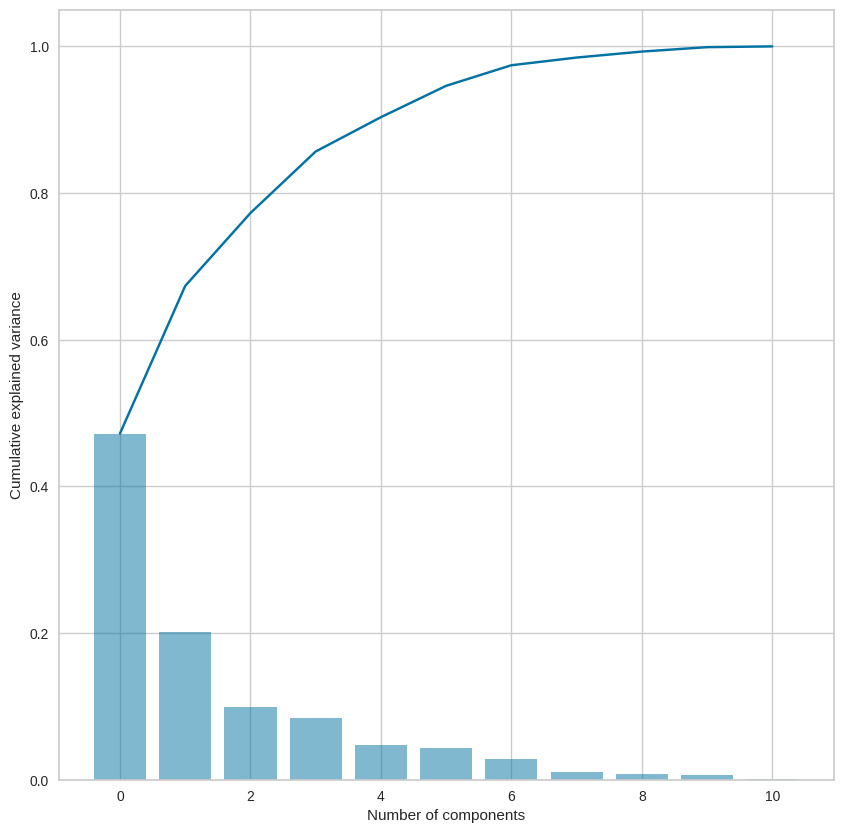

In [142]:
#Explained variance
ell = pca.explained_variance_ratio_
plt. figure()
plt.figure(figsize=(10, 10))
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

### Scree plot

0.6733470353578437

<Figure size 800x550 with 0 Axes>

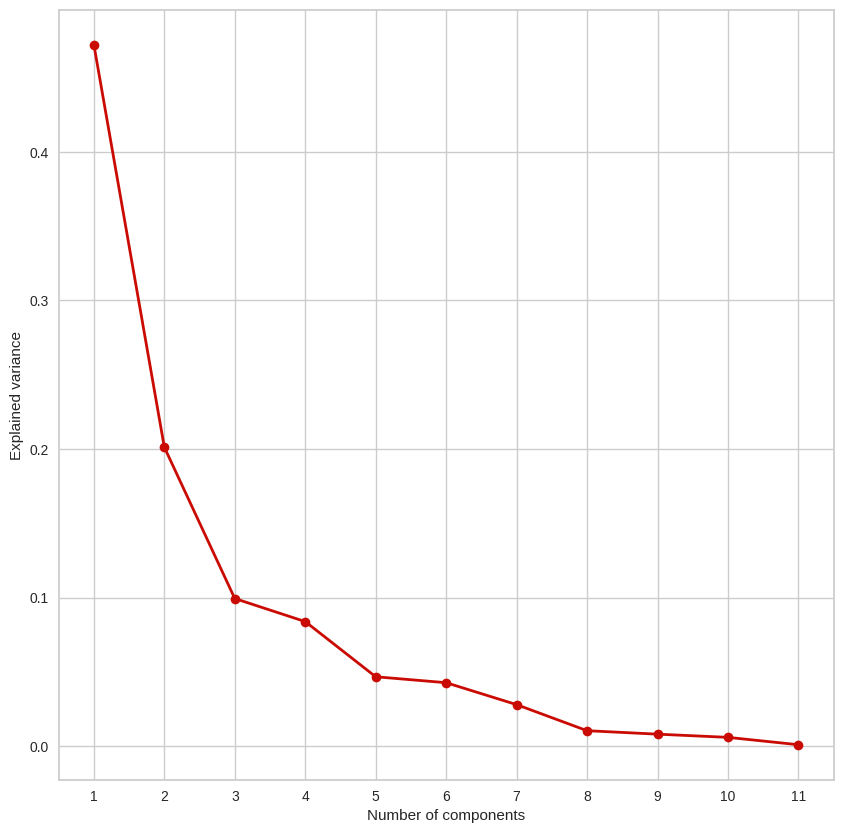

In [143]:
Lambda = pca.explained_variance_
plt. figure()
plt.figure(figsize=(10, 10))
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/Lambda.sum(), 'ro-', lw=2)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

(Lambda[1]+Lambda[0])/Lambda.sum()

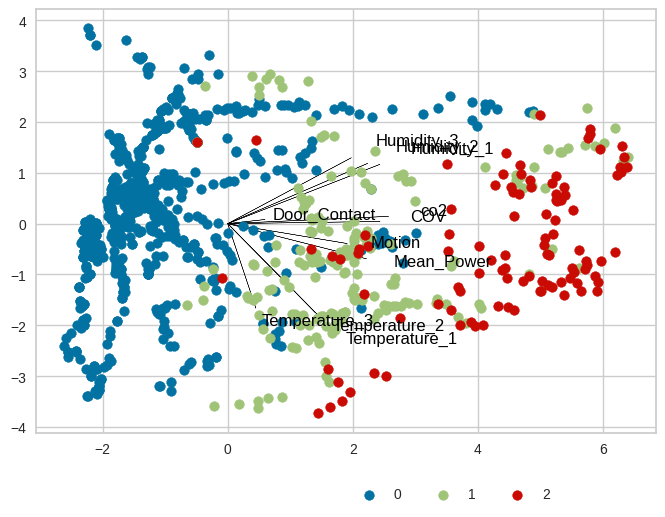

In [144]:
#Biplot
A1 = A[:,0]
A2 = A[:,1]
A3 = A[:,2]
Z1 = Z[:,0]
Z2 = Z[:,1]
Z3 = Z[:,2]

fig, ax = plt.subplots()

for i in range(len(A1)):
# arrows project features as vectors onto PC axes
    ax.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2),
              color='black', width=0.00005, head_width=0.0025)
    ax.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2, variables[i], color='black')

for i in df1['Presence'].unique():

  ax.scatter(Z1[df1['Presence']==i], Z2[df1['Presence']==i], marker='o',label=str(i))

legend = ax.legend(shadow=False, ncol=3, bbox_to_anchor=(0.85, -0.1))

plt.show()



Text(0.5, 1.0, '\n\nPrincipal components')

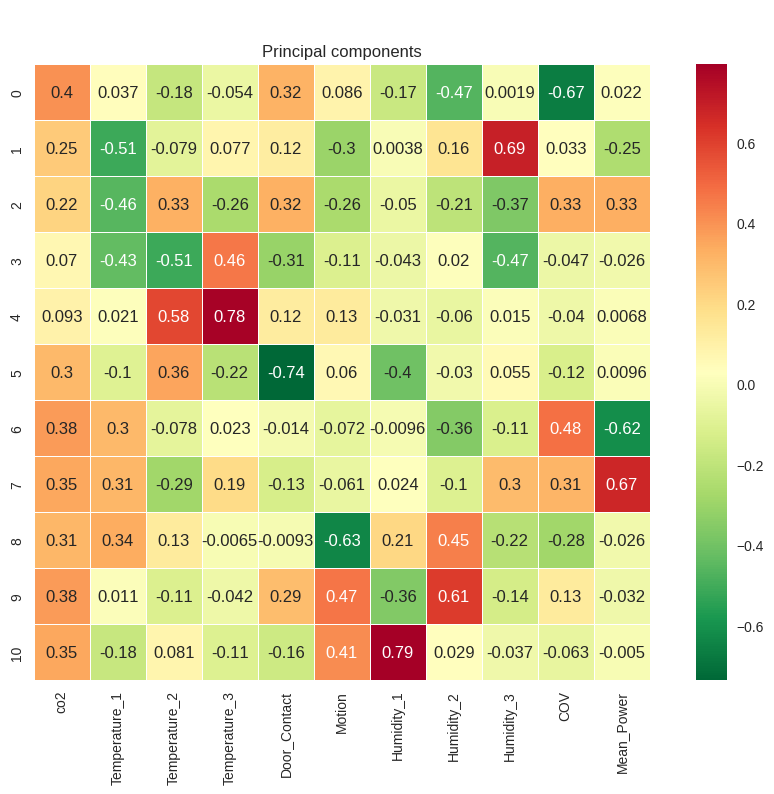

In [145]:
#heatmap
comps = pd.DataFrame(A,columns = ['co2', 'Temperature_1', 'Temperature_2', 'Temperature_3',
       'Door_Contact', 'Motion', 'Humidity_1', 'Humidity_2', 'Humidity_3',
       'COV', 'Mean_Power'])
plt.figure(figsize=(12, 8))
sns.heatmap(comps,cmap='RdYlGn_r', linewidths=0.5, annot=True,
            cbar=True, square=True)
ax.tick_params(labelbottom=False,labeltop=True)
plt.title('\n\nPrincipal components')

In [146]:
#Find out the number of components that covers 95% of explained variance
#In this case it is 2
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)
out['PC']

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [11] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [2] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [11] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


,PC1,PC2
0,-42.330385,3.063769
1,-42.113421,2.955436
2,-42.151116,3.169113
3,-42.151116,3.169113
4,-42.052801,3.260805
...,...,...
1063,42.840181,-48.284293
1064,86.109069,14.752672
1065,67.380195,11.948546
1066,74.892914,1.659115


[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '2 Principal Components explain [97.55%] of the variance'}, xlabel='PC1 (81.2% expl.var)', ylabel='PC2 (14.5% expl.var)'>)

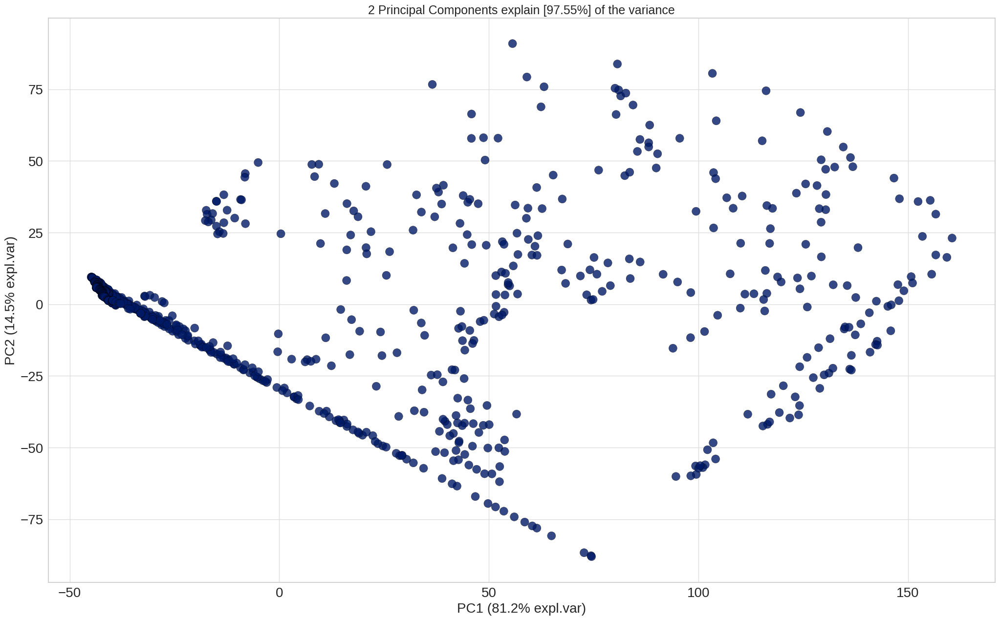

In [147]:
model.scatter(label=True)

In [148]:
#EigenVectors
A = out['loadings'].T
A

,PC1,PC2
co2,0.736546,-0.593946
Temperature_1,0.041552,0.027507
Temperature_2,0.056763,0.064185
Temperature_3,0.015456,0.021334
Door_Contact,0.000484,0.000304
Motion,0.004782,0.003819
Humidity_1,0.040556,-0.040406
Humidity_2,0.120555,-0.143318
Humidity_3,0.067287,-0.081129
COV,0.221746,-0.104514


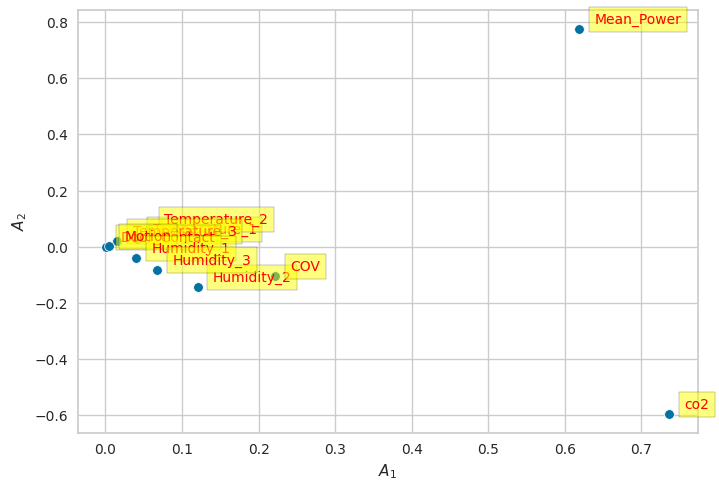

In [149]:
#Scatterplot
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))


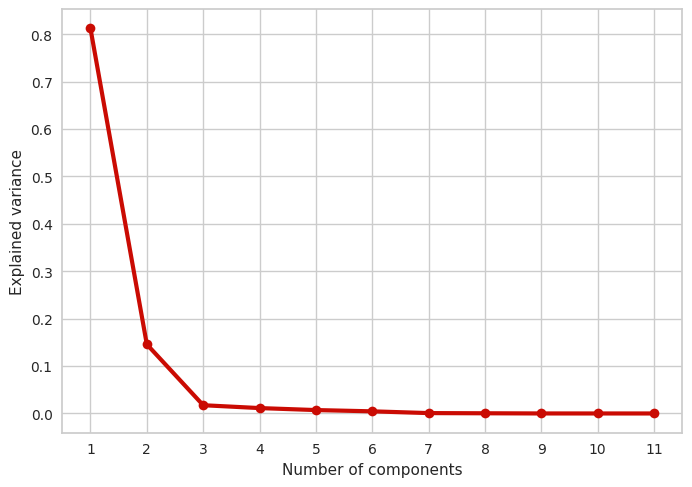

In [150]:
#Screeplot

VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

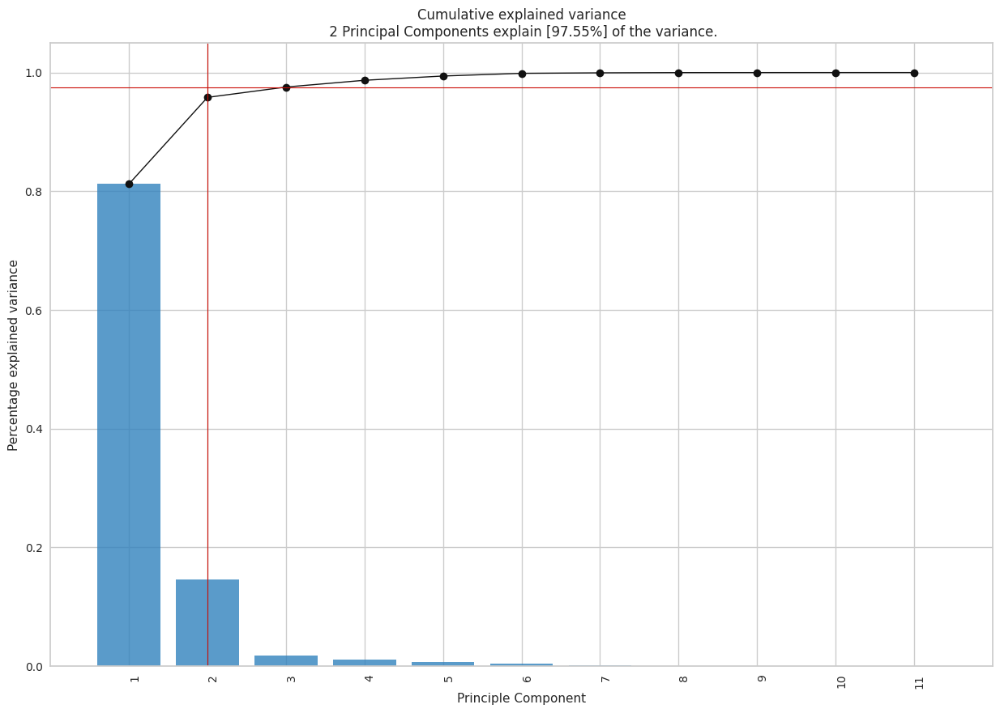

In [151]:
#Explained Variance Plot
model.plot();

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '2 Principal Components explain [97.55%] of the variance'}, xlabel='PC1 (81.2% expl.var)', ylabel='PC2 (14.5% expl.var)'>)

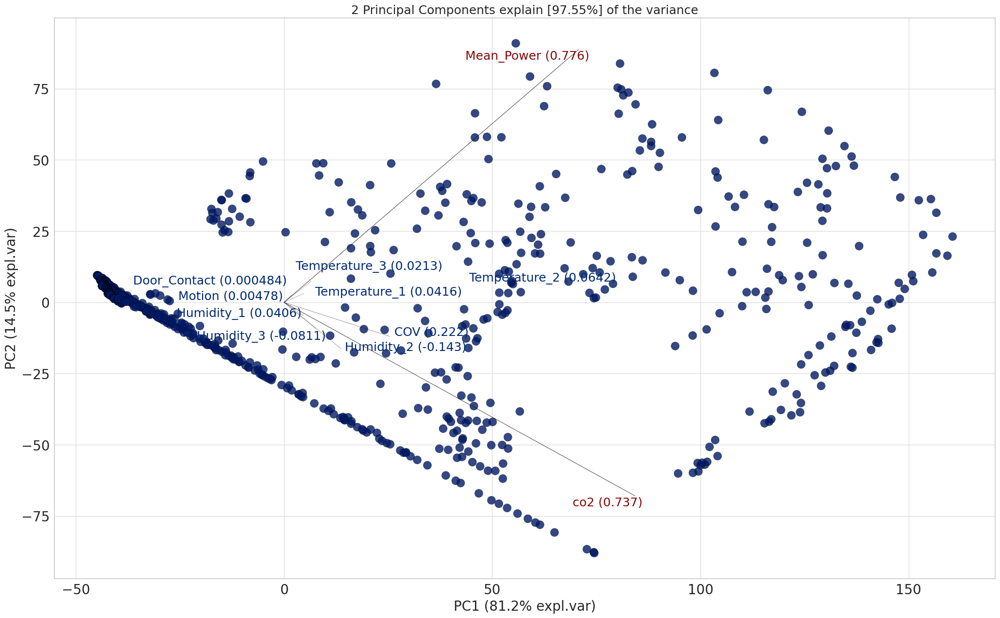

In [152]:
#Biplot
model.biplot(label=False, legend=False, color_arrow='k')

### Pycaret for Model Selection

### Pycaret

In [153]:
import pycaret
from pycaret.classification import *

In [154]:
from pycaret.utils import version
version()

'3.3.2'

In [155]:
#X_train, X_test, y_train, y_test = train_test_split(X,df['Presence'], test_size=0.25, stratify=df['Presence'], random_state = 42)
data_train = df1.sample(frac=0.75, random_state=42)
data_test = df1.drop(data_train.index)

In [156]:
data_train.reset_index(drop=True, inplace=True)
data_test.reset_index(drop=True, inplace=True)

print('Data for Training: ' + str(data_train.shape))
print('Data For Testing: ' + str(data_test.shape))

Data for Training: (801, 12)
Data For Testing: (267, 12)


In [157]:
from pycaret.classification import *
clf = setup(data=df1, target='Presence', train_size=0.75,session_id=123)


,Description,Value
0,Session id,123
1,Target,Presence
2,Target type,Multiclass
3,Original data shape,"(1068, 12)"
4,Transformed data shape,"(1068, 12)"
5,Transformed train set shape,"(801, 12)"
6,Transformed test set shape,"(267, 12)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


In [158]:
from pycaret.classification import ClassificationExperiment
exp = ClassificationExperiment()
# check the type of exp
type(exp)
# init setup on exp
exp.setup(df1, target = 'Presence', train_size=0.75,session_id = 123)
remove_metric('AUC')
remove_metric('Kappa')
remove_metric('MCC')

,Description,Value
0,Session id,123
1,Target,Presence
2,Target type,Multiclass
3,Original data shape,"(1068, 12)"
4,Transformed data shape,"(1068, 12)"
5,Transformed train set shape,"(801, 12)"
6,Transformed test set shape,"(267, 12)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


In [159]:
# compare baseline models
best = compare_models()

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
et,Extra Trees Classifier,0.9476,0.9476,0.9508,0.9475,0.1570
rf,Random Forest Classifier,0.9438,0.9438,0.9460,0.9437,0.2140
gbc,Gradient Boosting Classifier,0.9426,0.9426,0.9465,0.9429,0.5910
xgboost,Extreme Gradient Boosting,0.9401,0.9401,0.9433,0.9398,0.1100
lightgbm,Light Gradient Boosting Machine,0.9388,0.9388,0.9409,0.9386,0.3920
dt,Decision Tree Classifier,0.9276,0.9276,0.9330,0.9265,0.0270
qda,Quadratic Discriminant Analysis,0.9002,0.9002,0.9092,0.9020,0.0260
lda,Linear Discriminant Analysis,0.8965,0.8965,0.8984,0.8953,0.0470
lr,Logistic Regression,0.8839,0.8839,0.8838,0.8809,1.1340
nb,Naive Bayes,0.8815,0.8815,0.8935,0.8847,0.0270


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [160]:
best

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

## Create Random Forest Model

In [161]:
rf = create_model('rf')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9259,0.9259,0.9295,0.9260
1,0.9625,0.9625,0.9618,0.9619
2,0.9625,0.9625,0.9618,0.9619
3,0.9250,0.9250,0.9247,0.9241
4,0.9375,0.9375,0.9346,0.9353
5,0.9625,0.9625,0.9691,0.9600
6,0.9125,0.9125,0.9263,0.9169
7,0.9500,0.9500,0.9500,0.9500
8,0.9375,0.9375,0.9404,0.9386


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [162]:
tuned_rf=tune_model(rf)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9012,0.9012,0.9126,0.9056
1,0.9125,0.9125,0.9138,0.9127
2,0.9500,0.9500,0.9529,0.9495
3,0.9375,0.9375,0.9375,0.9375
4,0.9375,0.9375,0.9382,0.9373
5,0.9250,0.9250,0.9475,0.9268
6,0.9000,0.9000,0.9153,0.9052
7,0.9250,0.9250,0.9361,0.9275
8,0.9125,0.9125,0.9216,0.9153


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [163]:
tuned_rf

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

In [164]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create Extra Trees Classifier Model

In [165]:
et = create_model('et')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9506,0.9506,0.9517,0.9500
1,0.9625,0.9625,0.9644,0.9614
2,0.9750,0.9750,0.9752,0.9746
3,0.9375,0.9375,0.9381,0.9374
4,0.9625,0.9625,0.9618,0.9619
5,0.9625,0.9625,0.9691,0.9600
6,0.8875,0.8875,0.8985,0.8914
7,0.9500,0.9500,0.9564,0.9513
8,0.9250,0.9250,0.9279,0.9261


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [166]:
tuned_et=tune_model(et)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8889,0.8889,0.8925,0.8905
1,0.9250,0.9250,0.9250,0.9250
2,0.9500,0.9500,0.9500,0.9500
3,0.9375,0.9375,0.9381,0.9374
4,0.9375,0.9375,0.9377,0.9351
5,0.9375,0.9375,0.9463,0.9362
6,0.9000,0.9000,0.9167,0.9054
7,0.9375,0.9375,0.9408,0.9361
8,0.9125,0.9125,0.9225,0.9141


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [167]:
tuned_et

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

In [168]:
evaluate_model(tuned_et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create Gradient Boosting Classifier

In [169]:
gbc = create_model('gbc')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9259,0.9259,0.9295,0.9260
1,0.9625,0.9625,0.9618,0.9619
2,0.9750,0.9750,0.9766,0.9745
3,0.9125,0.9125,0.9133,0.9125
4,0.9500,0.9500,0.9488,0.9483
5,0.9500,0.9500,0.9611,0.9487
6,0.9000,0.9000,0.9099,0.9036
7,0.9500,0.9500,0.9531,0.9512
8,0.9250,0.9250,0.9304,0.9269


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [170]:
tuned_gbc=tune_model(gbc)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9012,0.9012,0.9012,0.9012
1,0.9375,0.9375,0.9346,0.9353
2,0.9750,0.9750,0.9752,0.9746
3,0.9250,0.9250,0.9247,0.9241
4,0.9375,0.9375,0.9346,0.9353
5,0.9500,0.9500,0.9549,0.9474
6,0.9000,0.9000,0.9052,0.9020
7,0.9625,0.9625,0.9618,0.9619
8,0.9500,0.9500,0.9500,0.9500


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [171]:
tuned_gbc

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [172]:
evaluate_model(tuned_gbc)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Find best model using PCA

In [273]:
clf_pca = setup(data=df1, target='Presence',train_size=0.75,normalize = True, session_id=125, pca = True, pca_components = 3)
remove_metric('AUC')
remove_metric('Kappa')
remove_metric('MCC')

,Description,Value
0,Session id,125
1,Target,Presence
2,Target type,Multiclass
3,Original data shape,"(1068, 12)"
4,Transformed data shape,"(1068, 4)"
5,Transformed train set shape,"(801, 4)"
6,Transformed test set shape,"(267, 4)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


In [272]:
best_pca = compare_models()

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
knn,K Neighbors Classifier,0.9176,0.9176,0.9218,0.9172,0.2060
et,Extra Trees Classifier,0.9126,0.9126,0.9156,0.9115,0.2300
rf,Random Forest Classifier,0.9051,0.9051,0.9091,0.9053,0.3480
xgboost,Extreme Gradient Boosting,0.8977,0.8977,0.9027,0.8980,0.1770
gbc,Gradient Boosting Classifier,0.8952,0.8952,0.9022,0.8950,0.6560
lightgbm,Light Gradient Boosting Machine,0.8952,0.8952,0.9024,0.8954,1.1840
dt,Decision Tree Classifier,0.8865,0.8865,0.8934,0.8877,0.0940
nb,Naive Bayes,0.8565,0.8565,0.8831,0.8627,0.1580
svm,SVM - Linear Kernel,0.8502,0.8502,0.8468,0.8424,0.1020
qda,Quadratic Discriminant Analysis,0.8477,0.8477,0.8714,0.8542,0.1040


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

### Classification Models with PCA and SMOTE for imbalanced data

In [175]:
clf_pca = setup(data=df1, target='Presence',train_size=0.75,normalize = True, session_id=125, pca = True, pca_components = 3, fix_imbalance=True)
remove_metric('AUC')
remove_metric('Kappa')
remove_metric('MCC')

,Description,Value
0,Session id,125
1,Target,Presence
2,Target type,Multiclass
3,Original data shape,"(1068, 12)"
4,Transformed data shape,"(2004, 4)"
5,Transformed train set shape,"(1737, 4)"
6,Transformed test set shape,"(267, 4)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


In [238]:
X_train_transformed= get_config(variable="X_train_transformed")
y_train_transformed = get_config(variable="y_train_transformed")
X_test_transformed = get_config(variable="X_test_transformed")
y_test_transformed = get_config(variable="y_test_transformed")

Class 0: 579 instances
Class 1: 579 instances
Class 2: 579 instances


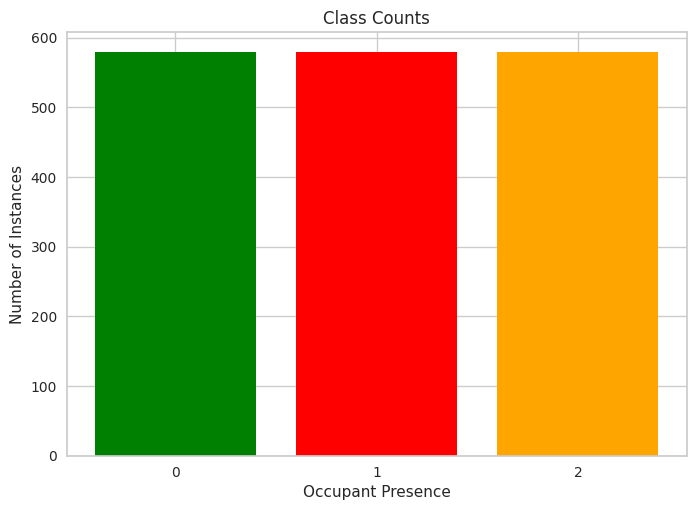

In [242]:
unique_classes, class_counts = np.unique(y_train_transformed, return_counts=True)
colors = ['green', 'red', 'orange']
# Print the results
for class_label, count in zip(unique_classes, class_counts):
    print(f"Class {class_label}: {count} instances")
plt.bar(unique_classes, class_counts, color=colors)
plt.xlabel('Occupant Presence')
plt.ylabel('Number of Instances')
plt.title('Class Counts')
plt.xticks(unique_classes.astype(int))
plt.show()

In [176]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
knn,K Neighbors Classifier,0.9226,0.9226,0.9283,0.9240,0.0640
et,Extra Trees Classifier,0.9126,0.9126,0.9205,0.9147,0.2210
rf,Random Forest Classifier,0.9077,0.9077,0.9158,0.9094,0.5070
lightgbm,Light Gradient Boosting Machine,0.9064,0.9064,0.9141,0.9081,0.7380
xgboost,Extreme Gradient Boosting,0.9027,0.9027,0.9091,0.9042,0.1950
dt,Decision Tree Classifier,0.8814,0.8814,0.8911,0.8842,0.0560
gbc,Gradient Boosting Classifier,0.8802,0.8802,0.8978,0.8857,0.9920
qda,Quadratic Discriminant Analysis,0.8689,0.8689,0.8809,0.8730,0.0560
nb,Naive Bayes,0.8627,0.8627,0.8799,0.8684,0.0560
lr,Logistic Regression,0.8540,0.8540,0.8791,0.8619,0.0840


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [177]:
compare_tree_models_results = pull()
compare_tree_models_results

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
knn,K Neighbors Classifier,0.9226,0.9226,0.9283,0.9240,0.064
et,Extra Trees Classifier,0.9126,0.9126,0.9205,0.9147,0.221
rf,Random Forest Classifier,0.9077,0.9077,0.9158,0.9094,0.507
lightgbm,Light Gradient Boosting Machine,0.9064,0.9064,0.9141,0.9081,0.738
xgboost,Extreme Gradient Boosting,0.9027,0.9027,0.9091,0.9042,0.195
dt,Decision Tree Classifier,0.8814,0.8814,0.8911,0.8842,0.056
gbc,Gradient Boosting Classifier,0.8802,0.8802,0.8978,0.8857,0.992
qda,Quadratic Discriminant Analysis,0.8689,0.8689,0.8809,0.8730,0.056
nb,Naive Bayes,0.8627,0.8627,0.8799,0.8684,0.056
lr,Logistic Regression,0.8540,0.8540,0.8791,0.8619,0.084


In [178]:
best_f1_models_top3 = compare_models(sort = 'F1', n_select = 3)

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
knn,K Neighbors Classifier,0.9226,0.9226,0.9283,0.9240,0.1020
et,Extra Trees Classifier,0.9126,0.9126,0.9205,0.9147,0.2560
rf,Random Forest Classifier,0.9077,0.9077,0.9158,0.9094,0.5220
lightgbm,Light Gradient Boosting Machine,0.9064,0.9064,0.9141,0.9081,0.7030
xgboost,Extreme Gradient Boosting,0.9027,0.9027,0.9091,0.9042,0.1940
gbc,Gradient Boosting Classifier,0.8802,0.8802,0.8978,0.8857,0.8010
dt,Decision Tree Classifier,0.8814,0.8814,0.8911,0.8842,0.0590
qda,Quadratic Discriminant Analysis,0.8689,0.8689,0.8809,0.8730,0.1080
nb,Naive Bayes,0.8627,0.8627,0.8799,0.8684,0.0940
lr,Logistic Regression,0.8540,0.8540,0.8791,0.8619,0.0590


Processing:   0%|          | 0/67 [00:00<?, ?it/s]

In [179]:
best_f1_models_top3

[KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                      metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                      weights='uniform'),
 ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                      criterion='gini', max_depth=None, max_features='sqrt',
                      max_leaf_nodes=None, max_samples=None,
                      min_impurity_decrease=0.0, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      monotonic_cst=None, n_estimators=100, n_jobs=-1,
                      oob_score=False, random_state=125, verbose=0,
                      warm_start=False),
 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                        criterion='gini', max_depth=None, max_features='sqrt',
                        max_leaf_nodes=None, max_samples=None,
                        min_impurity_decrease=0.0, min_samples

In [180]:
#This function trains a Soft Voting / Majority Rule classifier for select models passed in the estimator_list parameter.
blend_models(best_f1_models_top3)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9012,0.9012,0.9159,0.9057
1,0.9125,0.9125,0.9306,0.9158
2,0.9250,0.9250,0.9261,0.9245
3,0.8875,0.8875,0.8914,0.8893
4,0.8875,0.8875,0.9017,0.8931
5,0.9375,0.9375,0.9417,0.9393
6,0.9500,0.9500,0.9514,0.9505
7,0.8875,0.8875,0.8899,0.8882
8,0.9625,0.9625,0.9727,0.9644


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

VotingClassifier(estimators=[('K Neighbors Classifier',
                              KNeighborsClassifier(algorithm='auto',
                                                   leaf_size=30,
                                                   metric='minkowski',
                                                   metric_params=None,
                                                   n_jobs=-1, n_neighbors=5,
                                                   p=2, weights='uniform')),
                             ('Extra Trees Classifier',
                              ExtraTreesClassifier(bootstrap=False,
                                                   ccp_alpha=0.0,
                                                   class_weight=None,
                                                   criterion='gini',
                                                   max_depth=None,
                                                   max_features='sqrt',
                                                   max_leaf_nodes=...
                                                     criterion='gini',
                                                     max_depth=None,
                                                     max_features='sqrt',
                                                     max_leaf_nodes=None,
                                                     max_samples=None,
                                                     min_impurity_decrease=0.0,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                                     monotonic_cst=None,
                                                     n_estimators=100,
                                                     n_jobs=-1, oob_score=False,
                                                     random_state=125,
                                                     verbose=0,
                                                     warm_start=False))],
                 flatten_transform=True, n_jobs=-1, verbose=False,
                 voting='soft', weights=None)

In [181]:
#Tune best Model
best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

In [182]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9259,0.9259,0.9298,0.9268
1,0.9125,0.9125,0.9292,0.9164
2,0.9250,0.9250,0.9220,0.9225
3,0.9000,0.9000,0.9000,0.9000
4,0.9125,0.9125,0.9305,0.9170
5,0.9375,0.9375,0.9417,0.9393
6,0.9375,0.9375,0.9402,0.9378
7,0.8750,0.8750,0.8802,0.8756
8,0.9625,0.9625,0.9665,0.9631


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [184]:
tuned_best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=6, p=2,
                     weights='uniform')

In [185]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [186]:
#creating et Model

In [187]:
et_pca = create_model('et')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9259,0.9259,0.9313,0.9278
1,0.8875,0.8875,0.9080,0.8923
2,0.9000,0.9000,0.9045,0.9019
3,0.8750,0.8750,0.8843,0.8791
4,0.8750,0.8750,0.8846,0.8787
5,0.9500,0.9500,0.9565,0.9520
6,0.9375,0.9375,0.9401,0.9384
7,0.8750,0.8750,0.8802,0.8756
8,0.9500,0.9500,0.9667,0.9527


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [188]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8642,0.8642,0.8853,0.8713
1,0.8750,0.8750,0.8829,0.8782
2,0.8875,0.8875,0.8918,0.8884
3,0.8500,0.8500,0.8701,0.8579
4,0.9250,0.9250,0.9329,0.9264
5,0.8500,0.8500,0.8500,0.8500
6,0.8500,0.8500,0.8615,0.8552
7,0.8625,0.8625,0.8710,0.8645
8,0.9000,0.9000,0.9200,0.9051


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [190]:
param_et_pca_smote = tuned_et_pca.get_params()

In [191]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=125, verbose=0,
                     warm_start=False)

In [192]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [193]:
#Creating rf model with PCA
rf_pca = create_model('rf')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8765,0.8765,0.8951,0.8824
1,0.9250,0.9250,0.9377,0.9269
2,0.9125,0.9125,0.9145,0.9131
3,0.8875,0.8875,0.8971,0.8912
4,0.8875,0.8875,0.8968,0.8899
5,0.9250,0.9250,0.9317,0.9277
6,0.9000,0.9000,0.9025,0.8987
7,0.8875,0.8875,0.8925,0.8880
8,0.9500,0.9500,0.9667,0.9527


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [194]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8519,0.8519,0.8940,0.8625
1,0.9125,0.9125,0.9306,0.9158
2,0.9000,0.9000,0.9045,0.9019
3,0.9000,0.9000,0.9103,0.9034
4,0.8875,0.8875,0.9110,0.8939
5,0.8875,0.8875,0.9133,0.8906
6,0.8875,0.8875,0.8928,0.8899
7,0.8500,0.8500,0.8667,0.8549
8,0.8875,0.8875,0.9110,0.8939


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [195]:
tuned_rf_pca

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=125, verbose=0,
                       warm_start=False)

In [196]:
evaluate_model(tuned_rf_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [197]:
#Creating lightgbm model with PCA
knn_pca = create_model('knn')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9259,0.9259,0.9298,0.9268
1,0.9125,0.9125,0.9292,0.9164
2,0.9125,0.9125,0.9102,0.9112
3,0.9000,0.9000,0.9000,0.9000
4,0.9000,0.9000,0.9167,0.9054
5,0.9375,0.9375,0.9417,0.9393
6,0.9500,0.9500,0.9514,0.9505
7,0.8750,0.8750,0.8802,0.8756
8,0.9625,0.9625,0.9727,0.9644


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [198]:
knn_pca = tune_model(knn_pca)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9259,0.9259,0.9298,0.9268
1,0.9125,0.9125,0.9292,0.9164
2,0.9250,0.9250,0.9220,0.9225
3,0.9000,0.9000,0.9000,0.9000
4,0.9125,0.9125,0.9305,0.9170
5,0.9375,0.9375,0.9417,0.9393
6,0.9375,0.9375,0.9402,0.9378
7,0.8750,0.8750,0.8802,0.8756
8,0.9625,0.9625,0.9665,0.9631


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [199]:
knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=6, p=2,
                     weights='uniform')

In [200]:
evaluate_model(knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

### Save Best Model PCA

In [201]:
save_model(tuned_best_model_pca, 'best_pca')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['co2', 'Temperature_1',
                                              'Temperature_2', 'Temperature_3',
                                              'Door_Contact', 'Motion',
                                              'Humidity_1', 'Humidity_2',
                                              'Humidity_3', 'COV',
                                              'Mean_Power'],
                                     transformer=SimpleImputer(add_indicator=False,
                                                               copy=True,
                                                               fill_value=None,
                                                               keep_empty_features=False,
                                                               missing_...
                  TransformerWrapper(exclud

### Explainable AI using SHAP values

In [263]:
import shap

In [ ]:
interpret_model(tuned_et_pca, plot='summary')

In [268]:
interpret_model(tuned_et_pca, plot='reason', observation=13)

In [266]:
interpret_model(tuned_et_pca, plot='reason')

## Using SHAP only without pycaret

In [243]:
explainer = shap.Explainer(tuned_et_pca)
shap_values_cat=explainer(X_test_transformed)
print(np.shape(shap_values_cat))

(267, 3, 3)


In [246]:
tuned_et_pca.predict_proba(X_test_transformed)[0]

array([0.84, 0.14, 0.02])

Because we are doing multiclass classification, we cannot use SHAP built-in functions directly. We find an alternative by plotting shap plots individual class.

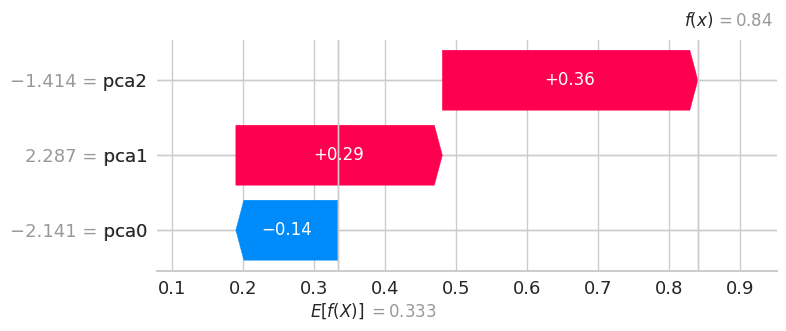

In [247]:
shap.plots.waterfall(shap_values_cat[0,:,0])

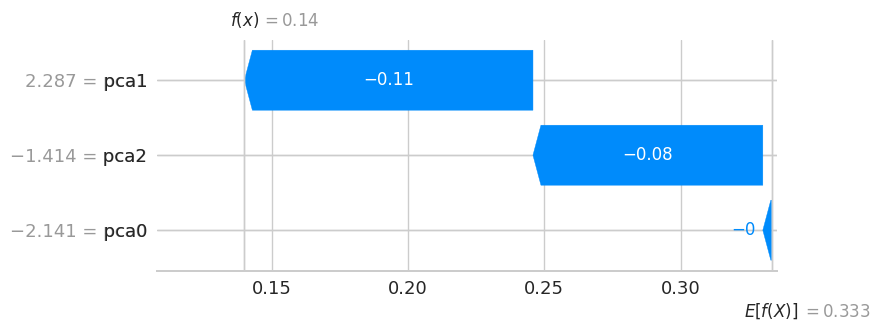

In [248]:
shap.plots.waterfall(shap_values_cat[0,:,1])

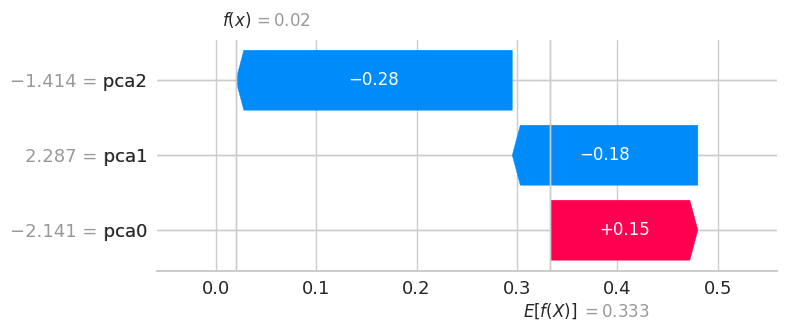

In [249]:
shap.plots.waterfall(shap_values_cat[0,:,2])

Alternatively, we can try to plot the means of the shapvalues for each class

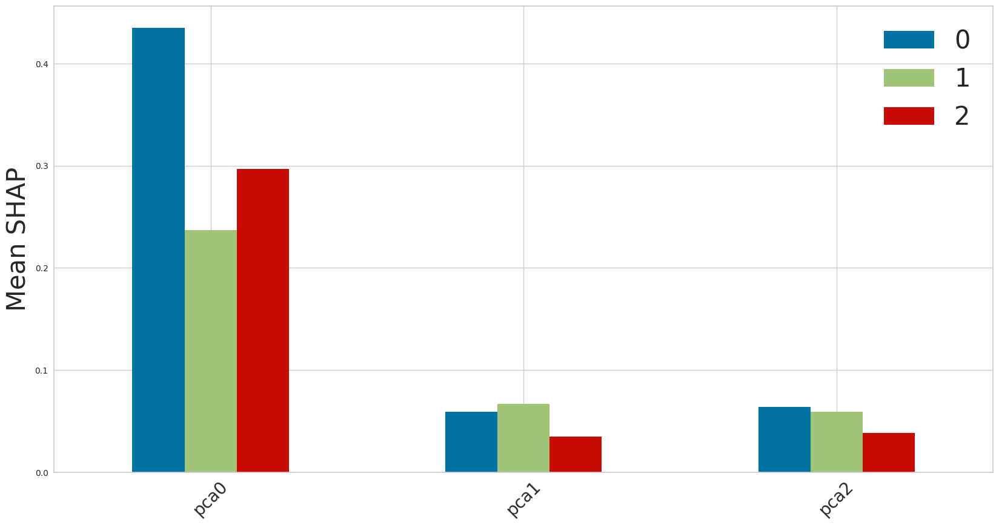

In [251]:
mean_0 = np.mean(np.abs(shap_values_cat.values[:,:,0]), axis=0)
mean_1 = np.mean(np.abs(shap_values_cat.values[:,:,1]), axis=0)
mean_2 = np.mean(np.abs(shap_values_cat.values[:,:,2]), axis=0)
dframe= pd.DataFrame({'0': mean_0, '1':mean_1, '2':mean_2})

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
dframe.plot.bar(ax=ax)

ax.set_ylabel("Mean SHAP", size=30)
ax.set_xticklabels(X_test_transformed.columns,rotation=45, size=20)
ax.legend(fontsize=30)

However, the above method can get a bit messy. An alternative way is to aggregate the plots together as follows

In [252]:
preds = tuned_et_pca.predict(X_test_transformed)
new_shap_values=[]
for i, pred in enumerate(preds):
  new_shap_values.append(shap_values_cat.values[i][:,pred])

shap_values_cat.values = np.array(new_shap_values)
print(shap_values_cat.shape)

(267, 3)


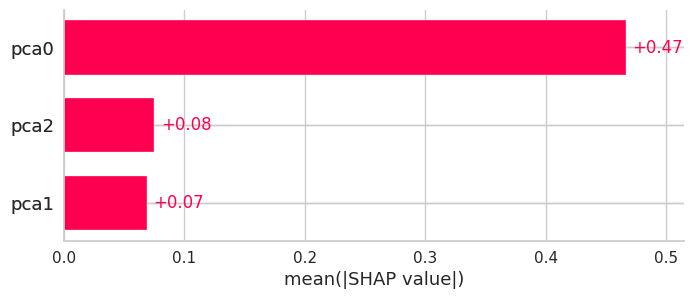

In [253]:
shap.plots.bar(shap_values_cat)

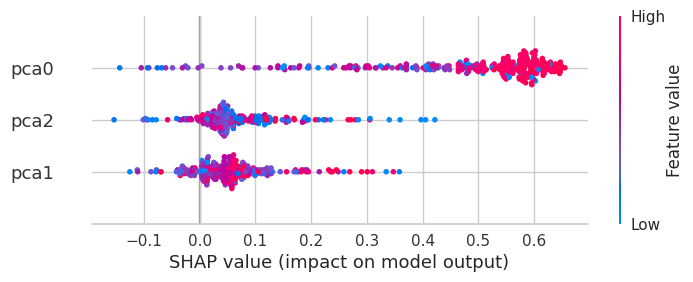

In [254]:
shap.plots.beeswarm(shap_values_cat)

In [255]:
shap.initjs()
shap.plots.force(shap_values_cat[...,0])

In [256]:
shap.initjs()
shap.plots.force(shap_values_cat[...,1])

In [257]:
shap.initjs()
shap.plots.force(shap_values_cat[...,2])

In [259]:
shap.initjs()
shap_values = explainer.shap_values(X_test_transformed)
shap.force_plot(explainer.expected_value[0], shap_values[..., 0], X_test_transformed)

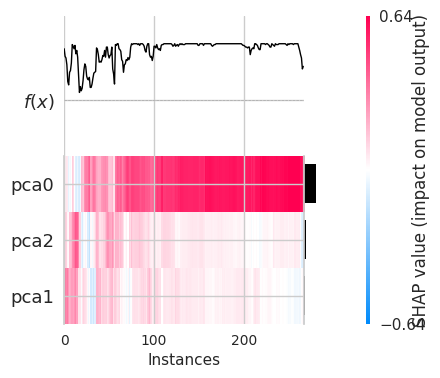

In [260]:
shap.plots.heatmap(shap_values_cat[:267])